### author by yangshichen
### 注意：脚本仅供参考，使用前请仔细阅读

### 调用GPU

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import seaborn as sb
from matplotlib.pyplot import rc_context
import matplotlib.pyplot as plt
import rapids_singlecell as rsc
from scipy.io import mmread
from scipy.sparse import csr_matrix
import cupy as cp
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
import scrublet as scr

import warnings
warnings.filterwarnings("ignore")

In [2]:
import rmm
rmm.reinitialize(managed_memory=True)
#cp.cuda.set_allocator(rmm.rmm_cupy_allocator)

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, frameon=False)
sc._settings.ScanpyConfig.n_jobs=70

scanpy==1.9.6 anndata==0.10.3 umap==0.5.5 numpy==1.24.4 scipy==1.11.4 pandas==1.5.3 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.10.8 pynndescent==0.5.11


In [4]:
cluster_cols = ["#DC050C", "#FB8072", "#1965B0", "#7BAFDE", "#882E72", 
                "#B17BA6", "#FF7F00", "#FDB462", "#E7298A", "#E78AC3", 
                "#33A02C", "#B2DF8A", "#55A1B1", "#8DD3C7", "#A6761D", 
                "#E6AB02", "#7570B3", "#BEAED4", "#666666", "#999999", 
                "#aa8282", "#d4b7b7", "#8600bf", "#ba5ce3", "#808000", 
                "#aeae5c", "#1e90ff", "#00bfff", "#56ff0d", "#ffff00"]

### 聚类分群1

In [5]:
adata = sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/B_raw.h5ad")
adata.X = adata.layers['counts'].copy()
adata

AnnData object with n_obs × n_vars = 295922 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered'
    var: 'hb', 'rp', 'ncRNA', 'LOC', 'erccs', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std'
    uns: 'age_colors', 'experiments_colors', 'hvg', 'leiden', 'leiden_r2.0_n2_colors', 'log1p', 'neighbors', 'pca', 'phase_ordered_colors', 'sample_colors', 'stage_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivitie

In [6]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata,batch_key="stage")
adata.var.highly_variable.value_counts()

normalizing counts per cell
    finished (0:01:09)
extracting highly variable genes
    finished (0:00:24)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


False    18250
True      3429
Name: highly_variable, dtype: int64

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:02:08)


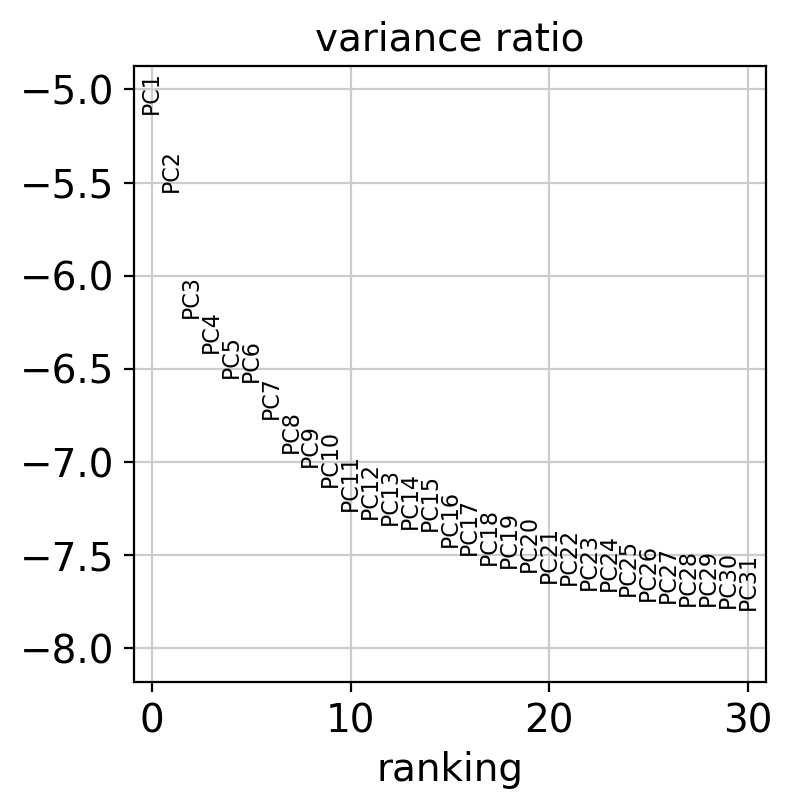

In [7]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack',n_comps=50,use_highly_variable=True)
sc.pl.pca_variance_ratio(adata,n_pcs=30,log=True)

In [8]:
rsc.pp.harmony_integrate(adata,key='experiments',max_iter_harmony = 30)

2024-05-08 15:00:29,600 - harmonypy_gpu - INFO - Iteration 1 of 30
2024-05-08 15:00:58,351 - harmonypy_gpu - INFO - Iteration 2 of 30
2024-05-08 15:01:27,391 - harmonypy_gpu - INFO - Iteration 3 of 30
2024-05-08 15:01:50,158 - harmonypy_gpu - INFO - Converged after 3 iterations


In [9]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=15, use_rep='X_pca_harmony')
sc.tl.umap(adata,min_dist = 0.5)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:50)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:08:01)


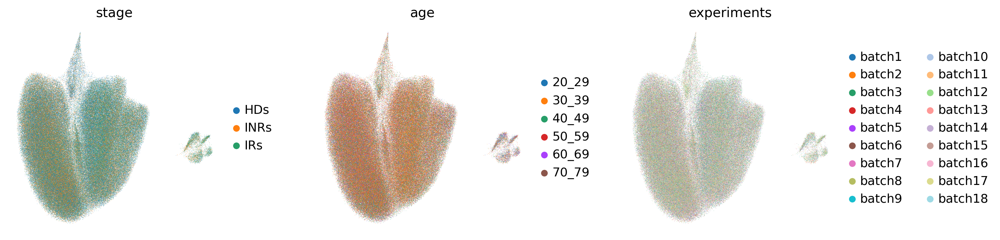

In [10]:
sc.pl.umap(adata, color=['stage', 'age', 'experiments'], wspace=0.3)

running Leiden clustering
    finished: found 56 clusters and added
    'leiden_r5.0_n2', the cluster labels (adata.obs, categorical) (0:01:49)


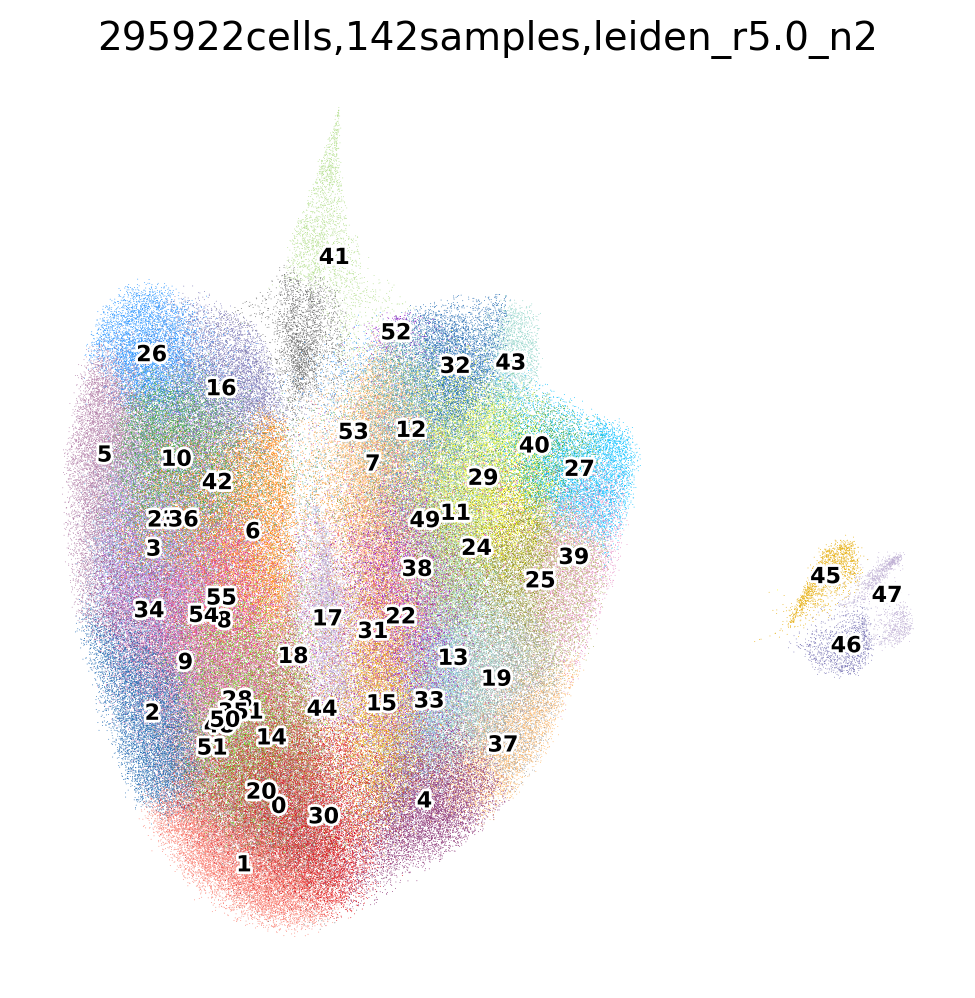

In [11]:
sc.tl.leiden(adata,resolution=5.0,n_iterations=2,key_added='leiden_r5.0_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r5.0_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='295922cells,142samples,leiden_r5.0_n2')

### 去除双胞群

In [17]:
subdata = adata[~adata.obs['leiden_r5.0_n2'].isin(['17','18','41','55'])]
subdata

View of AnnData object with n_obs × n_vars = 278699 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'leiden_r5.0_n2'
    var: 'hb', 'rp', 'ncRNA', 'LOC', 'erccs', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std', 'dispersions', 'dispersions_norm', 'highly_variable_intersection'
    uns: 'age_colors', 'experiments_colors', 'hvg', 'leiden', 'leiden_r2.0_n2_colors', 'log1p', 'neighbors', 'pca', 'phase_ordered_colors', 'sample_colors', 'stage_colors', 'umap', 'leiden_r5.0

In [18]:
subdata.write('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/B_filter.h5ad')

### 聚类分群2

In [5]:
adata = sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/B_filter.h5ad")
adata.X = adata.layers['counts'].copy()
adata

AnnData object with n_obs × n_vars = 278699 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'leiden_r5.0_n2'
    var: 'hb', 'rp', 'ncRNA', 'LOC', 'erccs', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std', 'dispersions', 'dispersions_norm', 'highly_variable_intersection'
    uns: 'age_colors', 'experiments_colors', 'hvg', 'leiden', 'leiden_r2.0_n2_colors', 'leiden_r5.0_n2_colors', 'log1p', 'neighbors', 'pca', 'phase_ordered_colors', 'sample_colors', 'stage_colors', 'um

In [6]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata,batch_key="stage")
adata.var.highly_variable.value_counts()

normalizing counts per cell
    finished (0:01:30)
extracting highly variable genes
    finished (0:01:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


False    18229
True      3450
Name: highly_variable, dtype: int64

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:01:58)


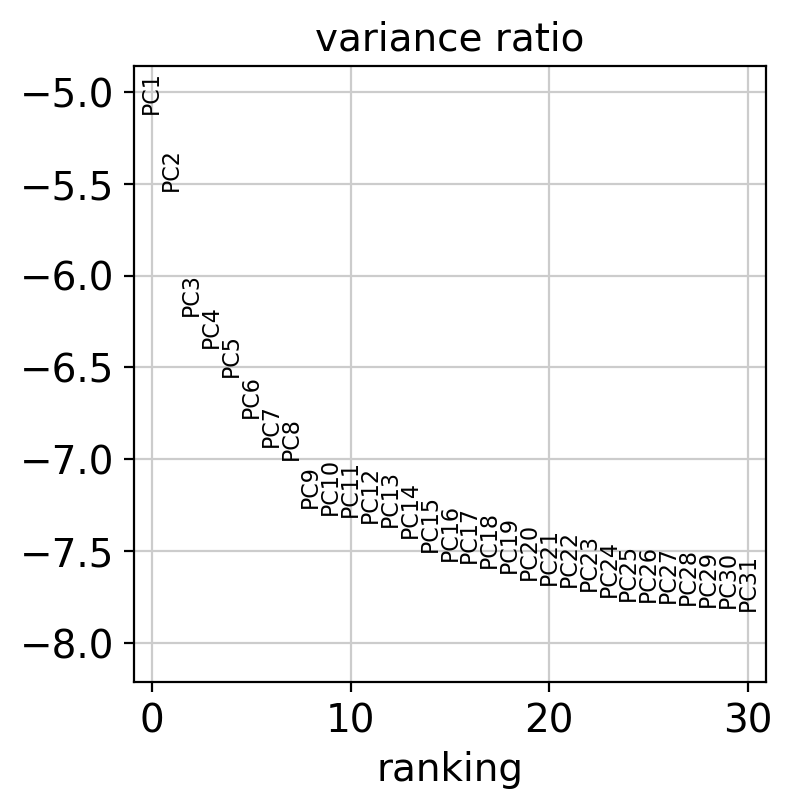

In [7]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack',n_comps=50,use_highly_variable=True)
sc.pl.pca_variance_ratio(adata,n_pcs=30,log=True)

In [8]:
rsc.pp.harmony_integrate(adata,key='experiments',max_iter_harmony = 30)

2024-05-09 09:48:12,045 - harmonypy_gpu - INFO - Iteration 1 of 30
2024-05-09 09:48:32,991 - harmonypy_gpu - INFO - Iteration 2 of 30
2024-05-09 09:48:54,560 - harmonypy_gpu - INFO - Iteration 3 of 30
2024-05-09 09:49:09,028 - harmonypy_gpu - INFO - Converged after 3 iterations


In [24]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=13, use_rep='X_pca_harmony')
sc.tl.umap(adata,min_dist = 0.35)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:06:42)


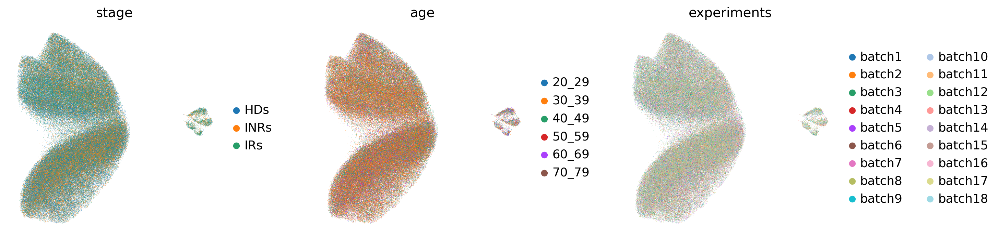

In [25]:
sc.pl.umap(adata, color=['stage', 'age', 'experiments'], wspace=0.3)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden_r1.5_n2', the cluster labels (adata.obs, categorical) (0:01:11)


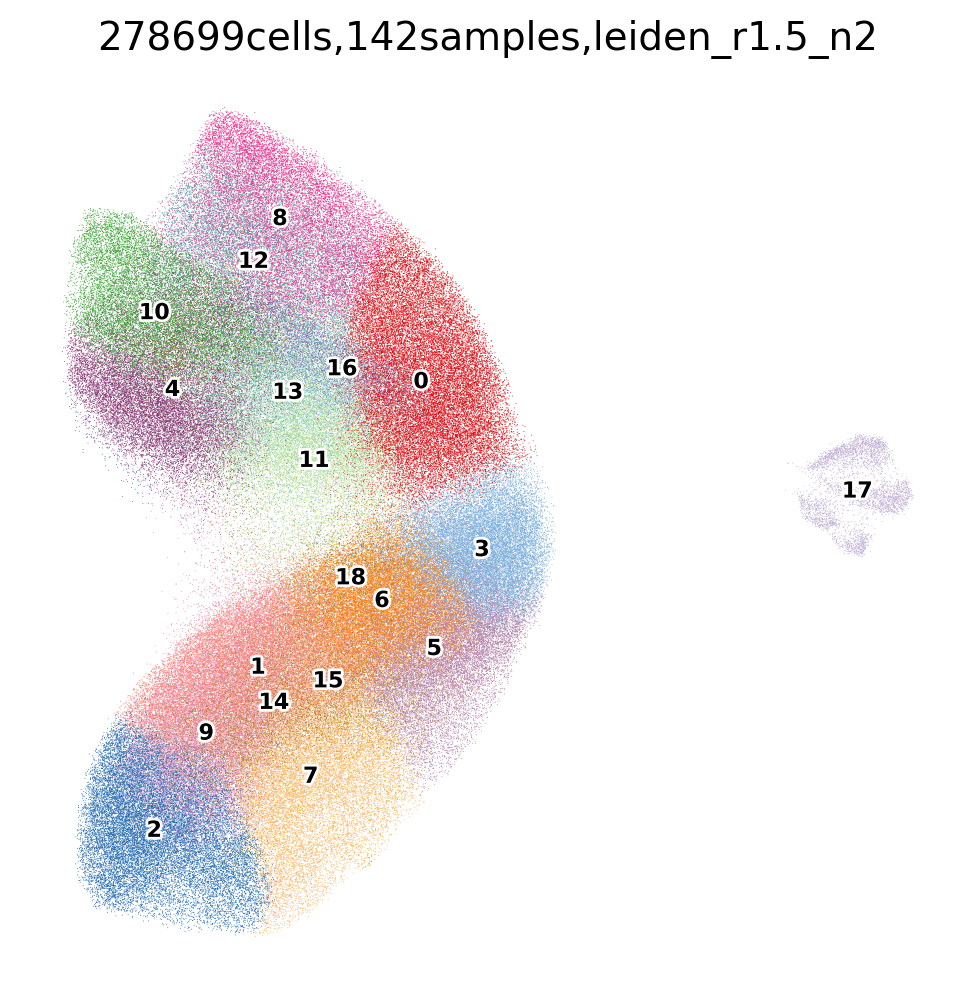

In [26]:
sc.tl.leiden(adata,resolution=1.5,n_iterations=2,key_added='leiden_r1.5_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r1.5_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='278699cells,142samples,leiden_r1.5_n2')

running Leiden clustering
    finished: found 22 clusters and added
    'leiden_r1.8_n2', the cluster labels (adata.obs, categorical) (0:01:13)


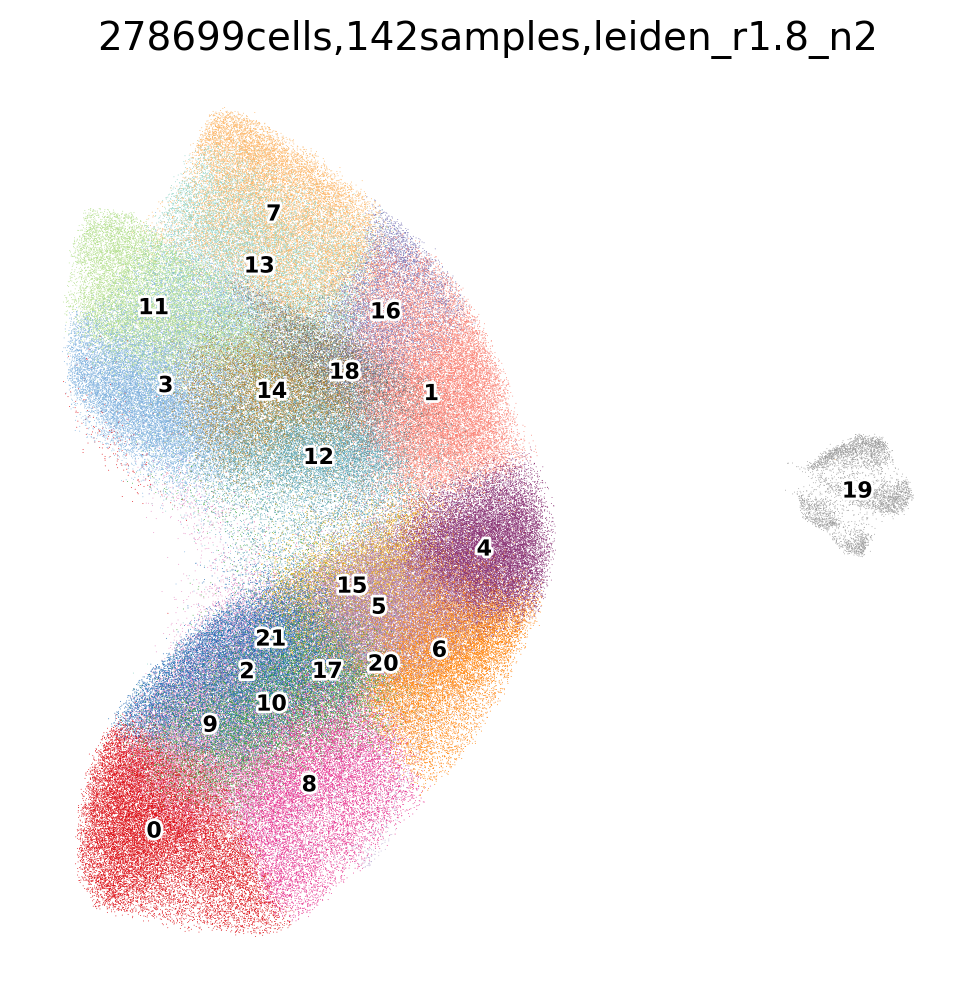

In [27]:
sc.tl.leiden(adata,resolution=1.8,n_iterations=2,key_added='leiden_r1.8_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r1.8_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='278699cells,142samples,leiden_r1.8_n2')

running Leiden clustering
    finished: found 26 clusters and added
    'leiden_r2.0_n2', the cluster labels (adata.obs, categorical) (0:01:20)


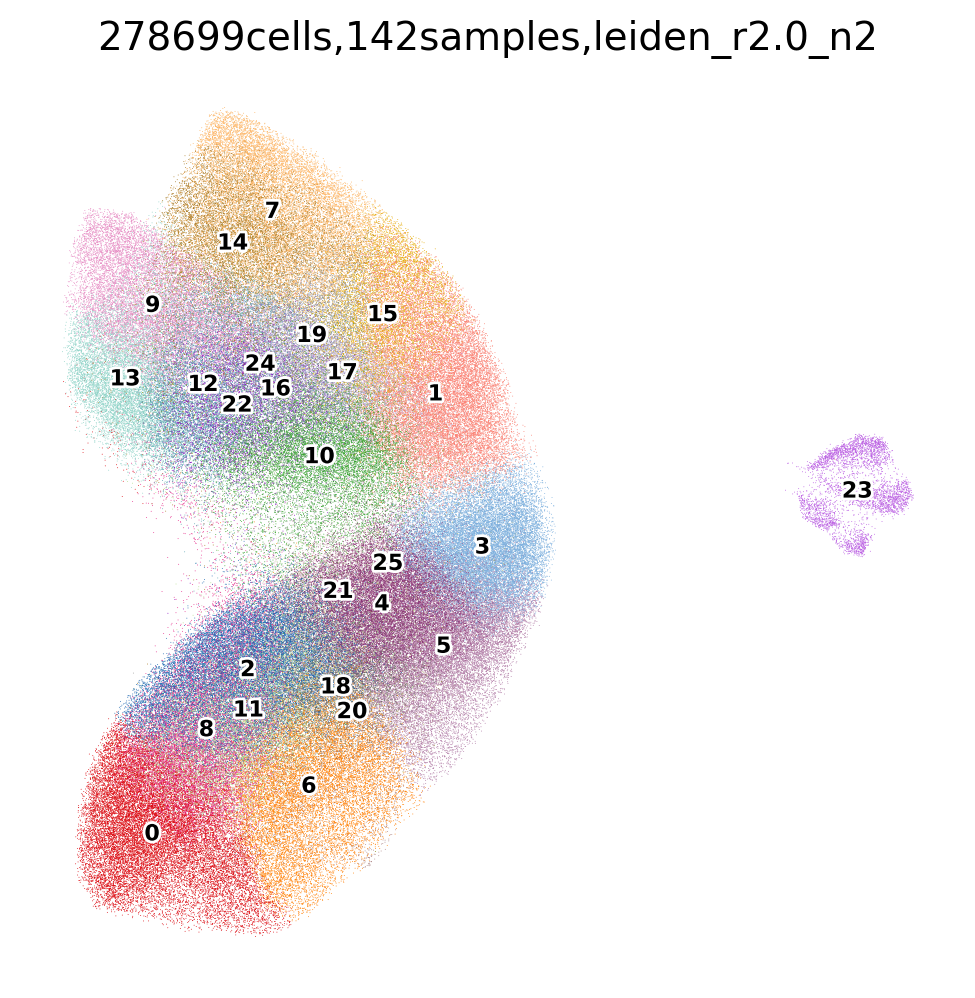

In [28]:
sc.tl.leiden(adata,resolution=2.0,n_iterations=2,key_added='leiden_r2.0_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r2.0_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='278699cells,142samples,leiden_r2.0_n2')

### Plasma亚聚类

In [123]:
adata=sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/B_filter.h5ad")
adata

AnnData object with n_obs × n_vars = 278699 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'leiden_r5.0_n2', 'leiden_r1.0_n2', 'leiden_r1.5_n2', 'leiden_r1.8_n2', 'celltype_L3'
    var: 'hb', 'rp', 'ncRNA', 'LOC', 'erccs', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std', 'dispersions', 'dispersions_norm', 'highly_variable_intersection'
    uns: 'age_colors', 'celltype_L3_colors', 'experiments_colors', 'hvg', 'leiden', 'leiden_r1.0_n2_colors', 'leiden_r1.5_n2_colors'

In [124]:
adata_sub = adata[adata.obs['leiden_r2.0_n2'].isin(['23'])]
adata_hvg = adata_sub[:,adata_sub.var["highly_variable"]==True]
adata_hvg

View of AnnData object with n_obs × n_vars = 4174 × 3450
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'leiden_r5.0_n2', 'leiden_r1.0_n2', 'leiden_r1.5_n2', 'leiden_r1.8_n2', 'celltype_L3'
    var: 'hb', 'rp', 'ncRNA', 'LOC', 'erccs', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std', 'dispersions', 'dispersions_norm', 'highly_variable_intersection'
    uns: 'age_colors', 'celltype_L3_colors', 'experiments_colors', 'hvg', 'leiden', 'leiden_r1.0_n2_colors', 'leiden_r1.5_n2_co

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


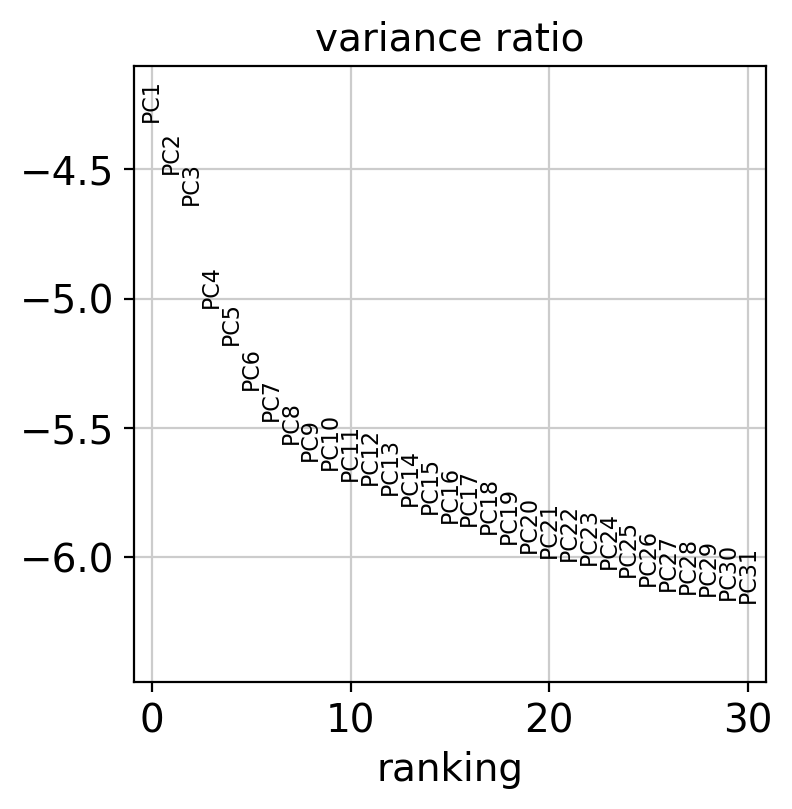

In [125]:
sc.tl.pca(adata_hvg, svd_solver='arpack',n_comps=50)
sc.pl.pca_variance_ratio(adata_hvg,n_pcs=30,log=True)

In [126]:
adata_sub.uns['pca'] = adata_hvg.uns['pca'].copy()
adata_sub.obsm['X_pca'] = adata_hvg.obsm['X_pca'].copy()

In [127]:
rsc.pp.harmony_integrate(adata_sub,key='experiments',max_iter_harmony = 30)

2024-05-09 18:03:34,235 - harmonypy_gpu - INFO - Iteration 1 of 30
2024-05-09 18:03:35,921 - harmonypy_gpu - INFO - Iteration 2 of 30
2024-05-09 18:03:36,816 - harmonypy_gpu - INFO - Iteration 3 of 30
2024-05-09 18:03:37,435 - harmonypy_gpu - INFO - Iteration 4 of 30
2024-05-09 18:03:37,958 - harmonypy_gpu - INFO - Iteration 5 of 30
2024-05-09 18:03:38,580 - harmonypy_gpu - INFO - Iteration 6 of 30
2024-05-09 18:03:39,101 - harmonypy_gpu - INFO - Iteration 7 of 30
2024-05-09 18:03:39,657 - harmonypy_gpu - INFO - Iteration 8 of 30
2024-05-09 18:03:40,175 - harmonypy_gpu - INFO - Iteration 9 of 30
2024-05-09 18:03:40,732 - harmonypy_gpu - INFO - Iteration 10 of 30
2024-05-09 18:03:41,255 - harmonypy_gpu - INFO - Iteration 11 of 30
2024-05-09 18:03:41,804 - harmonypy_gpu - INFO - Iteration 12 of 30
2024-05-09 18:03:42,325 - harmonypy_gpu - INFO - Iteration 13 of 30
2024-05-09 18:03:42,876 - harmonypy_gpu - INFO - Iteration 14 of 30
2024-05-09 18:03:43,397 - harmonypy_gpu - INFO - Iteratio

In [128]:
sc.pp.neighbors(adata_sub, n_neighbors=30, n_pcs=13, use_rep='X_pca_harmony')
sc.tl.umap(adata_sub,min_dist = 0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


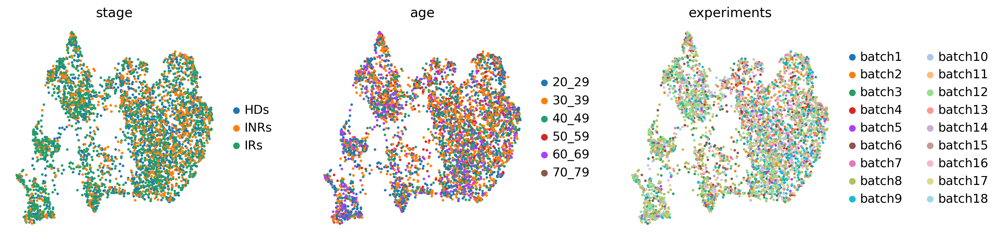

In [129]:
sc.pl.umap(adata_sub, color=['stage', 'age', 'experiments'], wspace=0.3)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden_r0.5_n2', the cluster labels (adata.obs, categorical) (0:00:00)


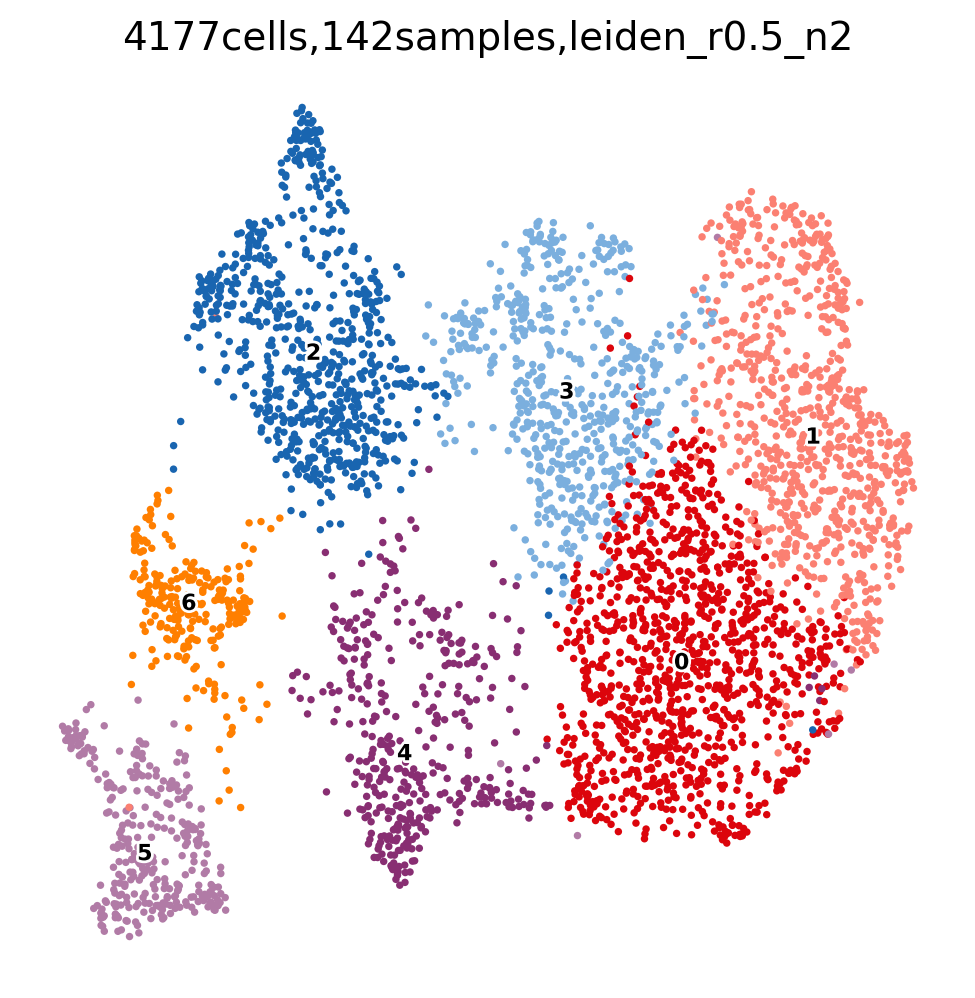

In [142]:
sc.tl.leiden(adata_sub,resolution=0.5,n_iterations=2,key_added='leiden_r0.5_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata_sub,color=['leiden_r0.5_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='4177cells,142samples,leiden_r0.5_n2')

In [144]:
new_cluster_names = ['Plasma_B_IGHA1','Plasma_B_IGHA1','Plasma_B_IGHG1','Plasma_B_IGHA1',
                     'Plasmablast_MKI67','Plasma_B_IGHA1','Plasma_B_IGHG1']
adata_sub.obs['leiden_r0.5_n2']=adata_sub.obs['leiden_r0.5_n2'].replace(
    to_replace = list(adata_sub.obs['leiden_r0.5_n2'].cat.categories.values),value = new_cluster_names)

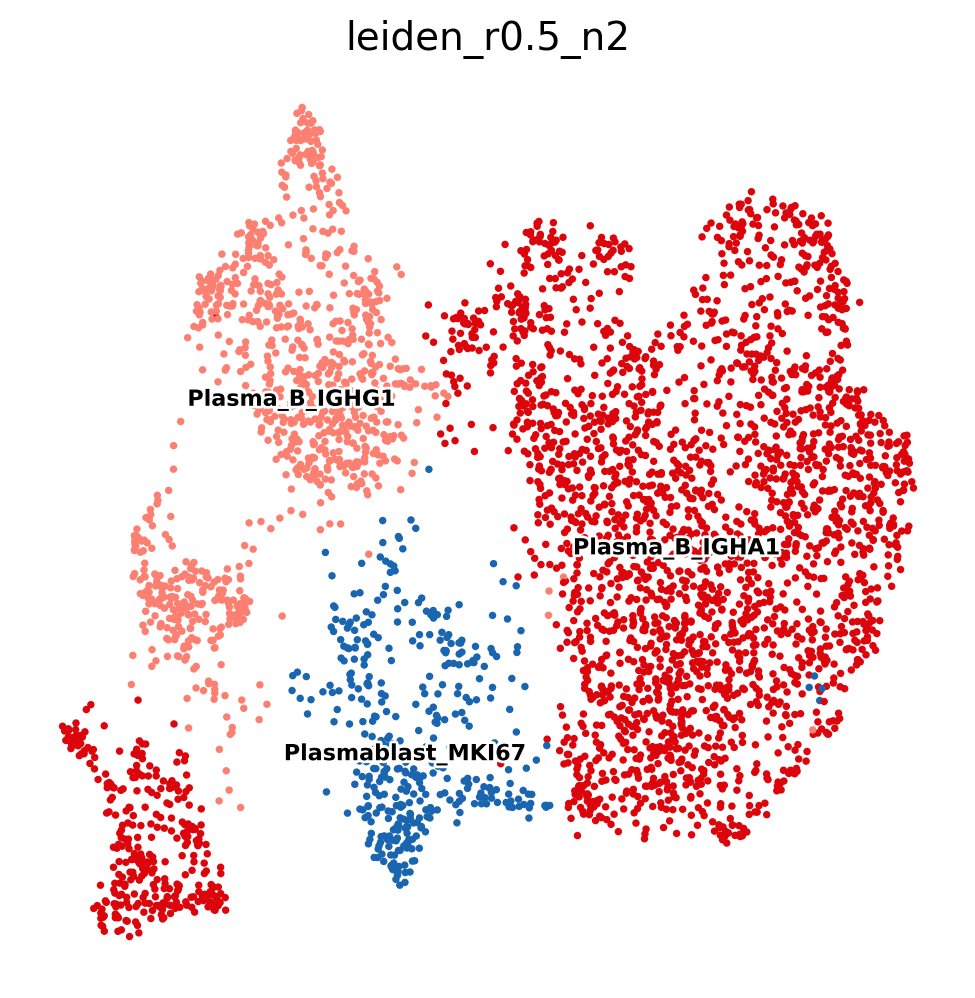

In [145]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata_sub, color=['leiden_r0.5_n2'], legend_loc='on data',
               legend_fontsize=8, legend_fontoutline=2,palette=cluster_cols)

In [147]:
adata.obs['celltype_r2.0'] = adata.obs['leiden_r2.0_n2']

In [148]:
adata.obs['celltype_r2.0'] = adata.obs.index.map(adata_sub.obs['leiden_r0.5_n2'].to_dict())

In [149]:
adata.obs['celltype_r2.0'].fillna(adata.obs['leiden_r2.0_n2'],inplace=True)

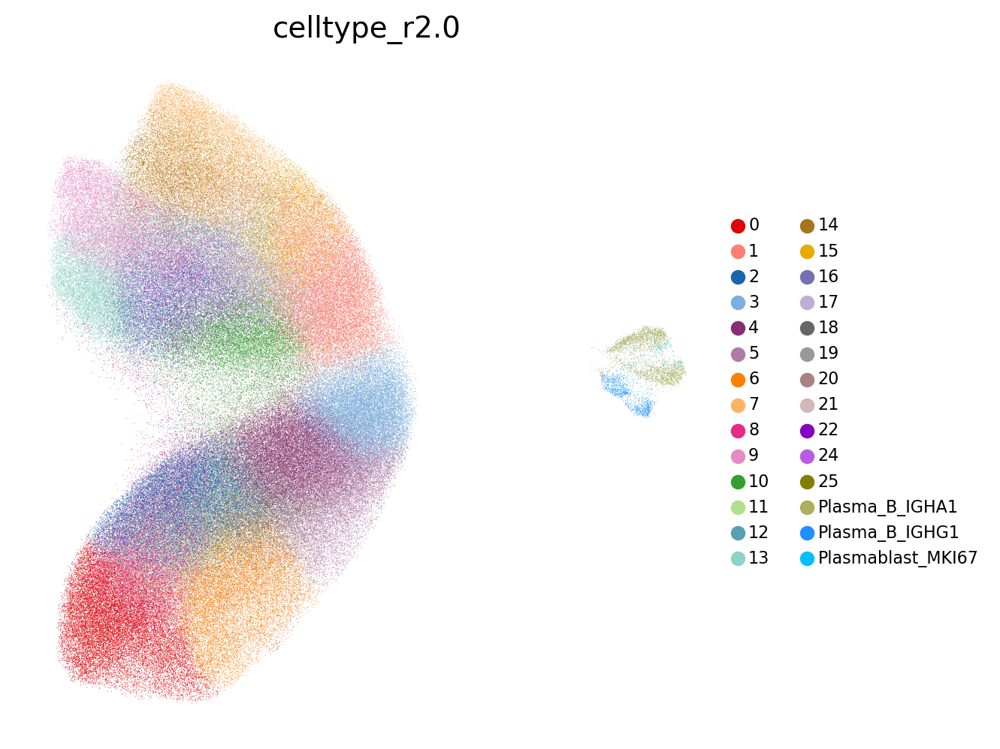

In [150]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata, color=['celltype_r2.0'],
               legend_fontsize=8, legend_fontoutline=2,palette=cluster_cols)

In [151]:
adata.write('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/B_filter.h5ad')

### COSG

In [5]:
adata=sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/B_filter.h5ad")
adata

AnnData object with n_obs × n_vars = 278699 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'leiden_r5.0_n2', 'leiden_r1.0_n2', 'leiden_r1.5_n2', 'leiden_r1.8_n2', 'celltype_L3', 'celltype_r2.0'
    var: 'hb', 'rp', 'ncRNA', 'LOC', 'erccs', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std', 'dispersions', 'dispersions_norm', 'highly_variable_intersection'
    uns: 'age_colors', 'celltype_L3_colors', 'celltype_r2.0_colors', 'experiments_colors', 'hvg', 'leiden', 'leiden

In [6]:
import cosg as cosg
import importlib
importlib.reload(cosg)

<module 'cosg' from '/home/yangshichen/mambaforge/envs/rsc/lib/python3.10/site-packages/cosg/__init__.py'>

In [7]:
cosg.cosg(adata,
    key_added='cosg',
    mu=1,
    n_genes_user=50,
    groupby='celltype_r2.0')

**finished identifying marker genes by COSG**


In [8]:
colnames = ['names', 'scores']
test = [pd.DataFrame(adata.uns["cosg"][c]) for c in colnames]
test = pd.concat(test, axis=1, names=[None, 'group'], keys=colnames)

markers = {}
cats = adata.obs['celltype_r2.0'].cat.categories
for i, c in enumerate(cats):
    cell_type_df = test.loc[:, 'names'][str(c)]
    scores_df = test.loc[:, 'scores'][str(c)]
    markers[str(c)] = cell_type_df.values.tolist()[:10]

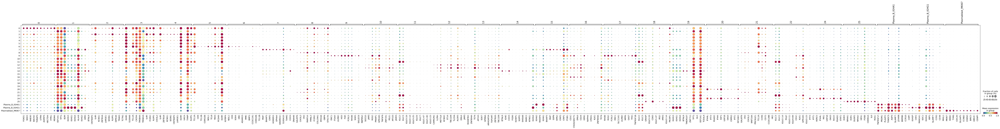

In [9]:
sc.pl.dotplot(adata, 
              var_names = markers, 
              groupby='celltype_r2.0',
              cmap='Spectral_r',
              standard_scale='var',save='_celltype_r2.0.pdf') 

In [10]:
marker_gene=pd.DataFrame(adata.uns['cosg']['names'])
marker_gene.head()

,0,1,10,11,12,13,14,15,16,17,...,3,4,5,6,7,8,9,Plasma_B_IGHA1,Plasma_B_IGHG1,Plasmablast_MKI67
0,FOXO1,EEF1A1,SOCS3,IGLC2,CAMK2N1,RHOBTB3,BTNL9,IGHA2,CD1C,RHOB,...,IGHM,IL4R,TCL1A,NEIL1,MIAT,GALNT6,ENC1,TNFRSF17,IGHGP,MKI67
1,NSD3,TPT1,JAM3,IGLC3,IL2RA,ZNF804A,IGHE,RASSF6,CSGALNACT1,RGS2,...,S100A8,ZBTB16,CD9,CD9,BAIAP3,CHI3L2,ITGAX,PRDM1,CAV1,RRM2
2,RAB30,B2M,RGS2,IGLV3-19,METTL8,TCF4,COCH,IGHA1,EML6,FCRL5,...,TCL1A,KCNG1,TCL1B,SOX4,CRIP2,CR2,LILRB2,PLAAT2,MAN1A1,TYMS
3,BACH2,IGHG3,PMAIP1,IGLV2-14,KCNH2,AP1S3,FGD6,BAIAP3,CD24,ENC1,...,CXCR4,SESN1,CORO2B,HRK,HOMER3,PARP14,HCK,TXNDC5,SDC1,CDC20
4,THRAP3,IGHG1,GPR183,IGLV3-25,ST14,SOX7,IGHEP1,MIAT,GEN1,SLC11A1,...,TMSB4X,CNTNAP2,NEIL1,ADAM23,EPHA4,FMNL3,FGR,AQP3,IGHG4,DLGAP5


In [11]:
marker_gene.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/B/figures/_celltype_r2.0_marker_gene.csv')

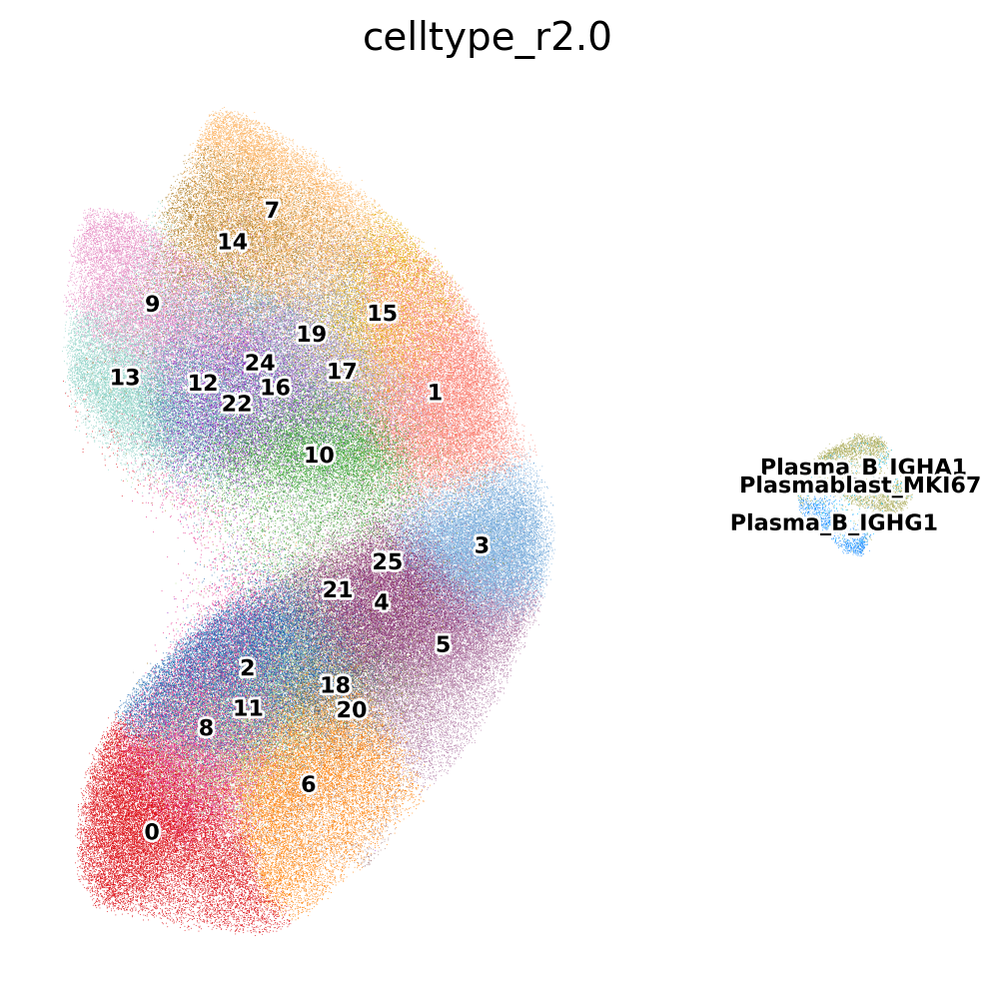

In [14]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata, color=['celltype_r2.0'],legend_loc="on data",
               legend_fontsize=8, legend_fontoutline=2,palette=cluster_cols)

### 注释

In [30]:
adata.obs = adata.obs.drop(['leiden_r5.0_n2','leiden_r1.0_n2','leiden_r1.5_n2', 'leiden_r1.8_n2','celltype_L3'],axis = 1)

In [33]:
new_cluster_names = ['Naive_B-TCL1A','Switched_Memory_B-CD27','Naive_B-TCL1A','Naive_B-TCL1A',
                     'Naive_B-TCL1A','Naive_B-TCL1A','Transitional_B-NEIL1','Switched_Memory_B-CD86',
                     'Naive_B-TCL1A','Aptypical_Memory_B-ITGAX','Unswitched_Memory_B-CD1C','Naive_B-TCL1A',
                     'Unswitched_Memory_B-CD1C','Unswitched_Memory_B-JAM3','Switched_Memory_B-IGHE',
                     'Switched_Memory_B-CD27','Unswitched_Memory_B-CD1C','Unswitched_Memory_B-CD1C',
                     'Naive_B-TCL1A','Switched_Memory_B-CD27','Naive_B-IFIT3','Naive_B-TCL1A',
                     'Unswitched_Memory_B-CD1C','Unswitched_Memory_B-IFIT3','Naive_B-IL6','Plasma_B-IGHA1',
                     'Plasma_B-IGHG1','Plasmablast-MKI67']
adata.obs['celltype_L3']=adata.obs['celltype_r2.0'].replace(to_replace = list(adata.obs['celltype_r2.0'].cat.categories.values),
                                                         value = new_cluster_names)

In [7]:
adata=sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/B_celltype.h5ad")
adata

AnnData object with n_obs × n_vars = 278699 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'celltype_r2.0', 'celltype_L3'
    var: 'hb', 'rp', 'ncRNA', 'LOC', 'erccs', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std', 'dispersions', 'dispersions_norm', 'highly_variable_intersection'
    uns: 'age_colors', 'celltype_L3_colors', 'celltype_r2.0_colors', 'cosg', 'experiments_colors', 'hvg', 'leiden', 'leiden_r1.0_n2_colors', 'leiden_r1.5_n2_colors', 'leiden_r1.8_n2_color

In [9]:
adata.obs['celltype_L3'] = adata.obs['celltype_L3'].replace({'Transitional B-NEIL1': 'Transitional_B-NEIL1'})

In [10]:
adata.obs['celltype_L3'].value_counts()

Naive_B-TCL1A                130919
Unswitched_Memory_B-CD1C      40024
Switched_Memory_B-CD27        33466
Transitional_B-NEIL1          15312
Switched_Memory_B-CD86        15161
Aptypical_Memory_B-ITGAX      12713
Unswitched_Memory_B-JAM3       9151
Switched_Memory_B-IGHE         8837
Naive_B-IFIT3                  4953
Plasma_B-IGHA1                 2801
Unswitched_Memory_B-IFIT3      2362
Naive_B-IL6                    1627
Plasma_B-IGHG1                  968
Plasmablast-MKI67               405
Name: celltype_L3, dtype: int64

In [8]:
phases = ['Naive_B-TCL1A','Naive_B-IL6','Naive_B-IFIT3','Transitional_B-NEIL1','Aptypical_Memory_B-ITGAX',
          'Unswitched_Memory_B-CD1C','Unswitched_Memory_B-IFIT3','Unswitched_Memory_B-JAM3',
          'Switched_Memory_B-CD27','Switched_Memory_B-CD86','Switched_Memory_B-IGHE','Plasma_B-IGHA1',
          'Plasma_B-IGHG1','Plasmablast-MKI67']
adata.obs["phase_ordered"] = pd.Categorical(values=adata.obs.celltype_L3, categories=phases, ordered=True)

In [9]:
B_colors={'Naive_B-TCL1A':'#FFF799',
          'Naive_B-IL6':'#D6BC46',
          'Naive_B-IFIT3':'#AB9556',
          'Transitional_B-NEIL1':'#E0DE8A',
          'Aptypical_Memory_B-ITGAX':'#E67762',
          'Unswitched_Memory_B-CD1C':'#B2778E',
          'Unswitched_Memory_B-IFIT3':'#C3555E',
          'Unswitched_Memory_B-JAM3':'#F9D3E3',
          'Switched_Memory_B-CD27':'#D39EB1',
          'Switched_Memory_B-CD86':'#D66047',
          'Switched_Memory_B-IGHE':'#A04236',
          'Plasma_B-IGHA1':'#BA7AB1',
          'Plasma_B-IGHG1':'#7D5284',
          'Plasmablast-MKI67':'#8A1874'
}

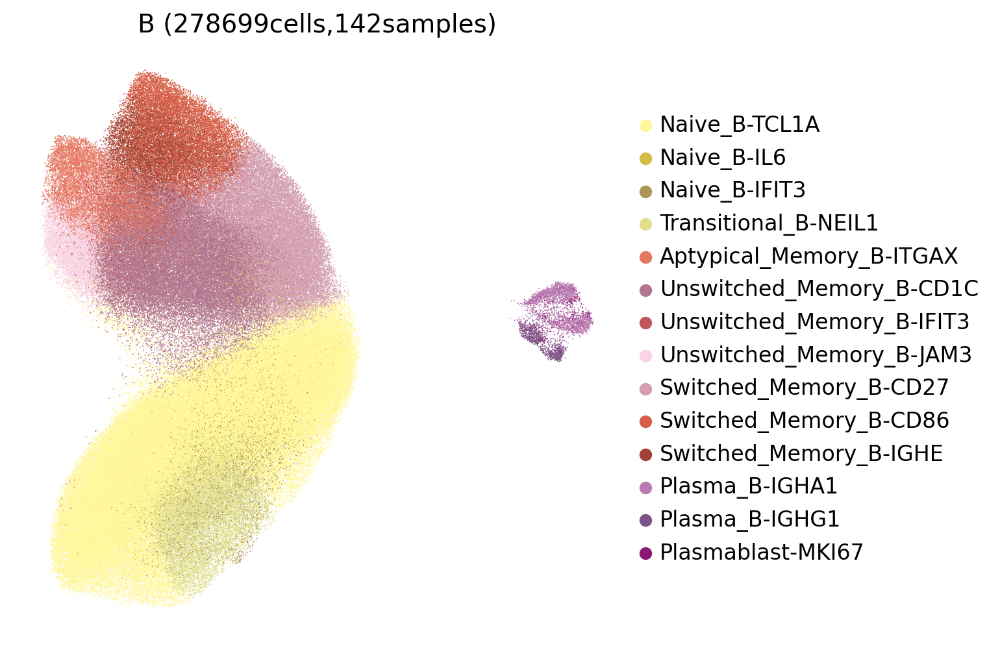

In [10]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['phase_ordered'],legend_fontsize=12,size=1.5,legend_fontoutline=2,
               palette=B_colors,title='B (278699cells,142samples)',#legend_loc="on data",
               save='_B_celltype_L3.pdf')

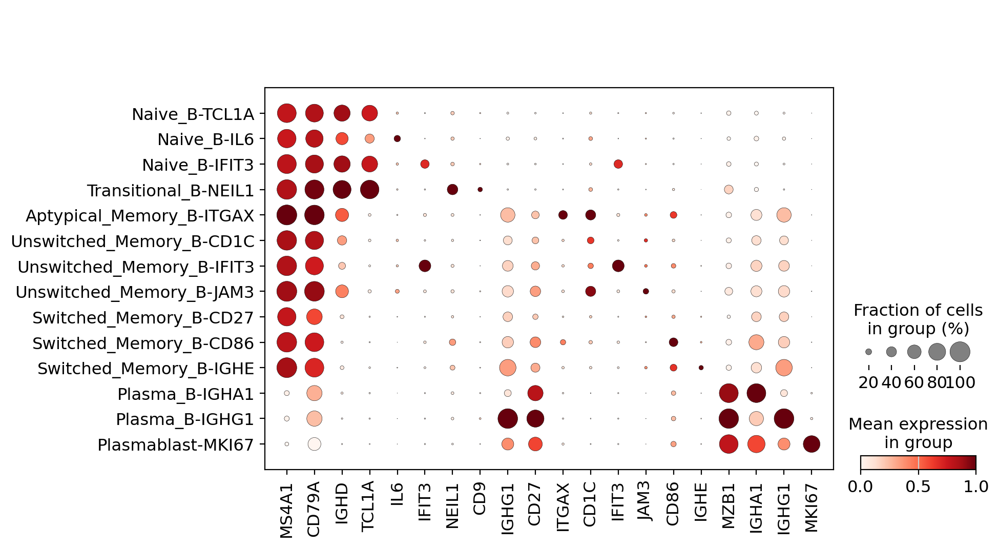

In [12]:
sc.pl.dotplot(adata, ["MS4A1","CD79A","IGHD",'TCL1A','IL6','IFIT3',"NEIL1",'CD9',
                      "IGHG1","CD27","ITGAX","CD1C","IFIT3","JAM3","CD86","IGHE","MZB1","IGHA1","IGHG1","MKI67"], 
              categories_order=['Naive_B-TCL1A','Naive_B-IL6','Naive_B-IFIT3','Transitional_B-NEIL1','Aptypical_Memory_B-ITGAX',
                                'Unswitched_Memory_B-CD1C','Unswitched_Memory_B-IFIT3','Unswitched_Memory_B-JAM3',
                                'Switched_Memory_B-CD27','Switched_Memory_B-CD86','Switched_Memory_B-IGHE','Plasma_B-IGHA1',
                                'Plasma_B-IGHG1','Plasmablast-MKI67'],standard_scale='var',
              groupby='celltype_L3',save='celltype_L3.pdf')

In [11]:
adata.write('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/B_celltype.h5ad')

### 细胞比例

In [12]:
# 计算每个样本中每种细胞类型的计数
cell_counts = adata.obs.groupby(['sample', 'celltype_L3']).size().reset_index(name='count')
# 计算每个样本中细胞类型的总计数
sample_totals = cell_counts.groupby('sample')['count'].sum().reset_index(name='total_count')
# 合并计数和总计数数据框
merged_data = pd.merge(cell_counts, sample_totals, on='sample')
# 计算每个样本中细胞类型的比例
merged_data['proportion'] = merged_data['count'] / merged_data['total_count']
# 输出结果
print(merged_data)
merged_data.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/B/proportions_L3.csv', index=False)

       sample                celltype_L3  count  total_count  proportion
0     HD-H134              Naive_B-TCL1A   1498         3609    0.415073
1     HD-H134     Switched_Memory_B-CD27    854         3609    0.236631
2     HD-H134       Transitional_B-NEIL1     91         3609    0.025215
3     HD-H134     Switched_Memory_B-CD86    181         3609    0.050152
4     HD-H134   Aptypical_Memory_B-ITGAX     76         3609    0.021058
...       ...                        ...    ...          ...         ...
1983  PD-H308  Unswitched_Memory_B-IFIT3     10         1466    0.006821
1984  PD-H308                Naive_B-IL6      4         1466    0.002729
1985  PD-H308             Plasma_B-IGHA1      6         1466    0.004093
1986  PD-H308             Plasma_B-IGHG1      1         1466    0.000682
1987  PD-H308          Plasmablast-MKI67      0         1466    0.000000

[1988 rows x 5 columns]


In [ ]:
# 计算每个样本中每种细胞类型的计数
cell_counts = adata.obs.groupby(['sample']).size().reset_index(name='count')
# 计算每个样本中细胞类型的总计数
sample_totals = cell_counts.groupby('sample')['count'].sum().reset_index(name='total_count')
# 合并计数和总计数数据框
merged_data = pd.merge(cell_counts, sample_totals, on='sample')
# 计算每个样本中细胞类型的比例
merged_data['proportion'] = merged_data['count'] / merged_data['total_count']
# 输出结果
print(merged_data)
merged_data.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD4/proportions_L1.csv', index=False)

### DEG

In [27]:
adata=sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/B_celltype.h5ad")
adata

AnnData object with n_obs × n_vars = 278699 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'celltype_r2.0', 'celltype_L3'
    var: 'hb', 'rp', 'ncRNA', 'LOC', 'erccs', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std', 'dispersions', 'dispersions_norm', 'highly_variable_intersection'
    uns: 'age_colors', 'celltype_L3_colors', 'celltype_r2.0_colors', 'cosg', 'experiments_colors', 'hvg', 'leiden', 'leiden_r1.0_n2_colors', 'leiden_r1.5_n2_colors', 'leiden_r1.8_n2_color

In [28]:
unique_celltypes = adata.obs['celltype_L3'].unique()
unique_celltypes

['Switched_Memory_B-CD27', 'Unswitched_Memory_B-CD1C', 'Switched_Memory_B-CD86', 'Naive_B-TCL1A', 'Switched_Memory_B-IGHE', ..., 'Unswitched_Memory_B-IFIT3', 'Unswitched_Memory_B-JAM3', 'Plasma_B-IGHA1', 'Plasma_B-IGHG1', 'Plasmablast-MKI67']
Length: 14
Categories (14, object): ['Naive_B-TCL1A', 'Switched_Memory_B-CD27', 'Transitional B-NEIL1', 'Switched_Memory_B-CD86', ..., 'Naive_B-IL6', 'Plasma_B-IGHA1', 'Plasma_B-IGHG1', 'Plasmablast-MKI67']

In [29]:
for celltype in unique_celltypes:
    celltype_data = adata[adata.obs['celltype_L3'] == celltype, :]
    celltype_data.uns['log1p']['base']=None
    sc.tl.rank_genes_groups(celltype_data, groupby='stage',groups=['IRs','INRs'],reference='HDs',method='wilcoxon', key_added = "wilcoxon_HDs")
    sc.tl.rank_genes_groups(celltype_data, groupby='stage',groups=['INRs'],reference='IRs',method='wilcoxon', key_added = "wilcoxon_IRs")
    genes1 = sc.get.rank_genes_groups_df(celltype_data, group='IRs', key='wilcoxon_HDs')
    genes2 = sc.get.rank_genes_groups_df(celltype_data, group='INRs', key='wilcoxon_HDs')
    genes3 = sc.get.rank_genes_groups_df(celltype_data, group='INRs', key='wilcoxon_IRs')
    genes1.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/B/DEG/{}_IRs_vs_HDs.csv'.format(celltype), index=False)
    genes2.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/B/DEG/{}_INRs_vs_HDs.csv'.format(celltype), index=False)
    genes3.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/B/DEG/{}_INRs_vs_IRs.csv'.format(celltype), index=False)

ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:25)
ranking genes
    finished: added to `.uns['wilcoxon_IRs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:28)
ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group